In [ ]:
!pip install torch torchvision pytorch_lightning joblib opencv-python

In [ ]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import joblib
import os

from PIL import *
import cv2

import time
import math

import torch
from torch import nn
from torch.optim import SGD
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import pytorch_lightning as pl
from tqdm.cli import tqdm as tq

from statistics import mean
from typing import Tuple, Dict, Iterable

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
%reload_ext autoreload

In [ ]:
autoreload 2

In [ ]:
plt.rcParams['figure.figsize'] = [12, 6]
plt.rcParams['figure.dpi'] = 300

In [ ]:
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

In [ ]:
import torch
import torchvision
from torchvision.models.detection import MaskRCNN
from torchvision.models.detection.anchor_utils import AnchorGenerator

# load a pre-trained model for classification and return
# only the features
backbone = torchvision.models.mobilenet_v2(pretrained=True).features
# MaskRCNN needs to know the number of
# output channels in a backbone. For mobilenet_v2, it's 1280
# so we need to add it here
backbone.out_channels = 1280

# let's make the RPN generate 5 x 3 anchors per spatial
# location, with 5 different sizes and 3 different aspect
# ratios. We have a Tuple[Tuple[int]] because each feature
# map could potentially have different sizes and
# aspect ratios
anchor_generator = AnchorGenerator(sizes=((32, 64, 128, 256, 512),),
                                   aspect_ratios=((0.5, 1.0, 2.0),))

# let's define what are the feature maps that we will
# use to perform the region of interest cropping, as well as
# the size of the crop after rescaling.
# if your backbone returns a Tensor, featmap_names is expected to
# be ['0']. More generally, the backbone should return an
# OrderedDict[Tensor], and in featmap_names you can choose which
# feature maps to use.
roi_pooler = torchvision.ops.MultiScaleRoIAlign(featmap_names=['0'],
                                                output_size=7,
                                                sampling_ratio=2)

mask_roi_pooler = torchvision.ops.MultiScaleRoIAlign(featmap_names=['0'],
                                                     output_size=14,
                                                     sampling_ratio=2)
# put the pieces together inside a MaskRCNN model
model = MaskRCNN(backbone,
                 num_classes=2,
                 rpn_anchor_generator=anchor_generator,
                 box_roi_pool=roi_pooler,
                 mask_roi_pool=mask_roi_pooler)
model.eval()
x = [torch.rand(3, 300, 400), torch.rand(3, 500, 400)]
predictions = model(x)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
model = maskrcnn_resnet50_fpn(
    pretrained = True,
)

# Change number of output classes to two ( no-crater, crater )
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor( in_features, num_classes = 2 )

param_size = 0
for param in model.parameters():
    param_size += param.nelement() * param.element_size()
buffer_size = 0
for buffer in model.buffers():
    buffer_size += buffer.nelement() * buffer.element_size()

size_all_mb = ( param_size + buffer_size ) / 1024 ** 2
print('model size: {:.3f}MB'.format(size_all_mb))

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


model size: 168.043MB


In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [ ]:
import sys
print (sys.path)

['/content', '/env/python', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '', '/usr/local/lib/python3.10/dist-packages', '/usr/lib/python3/dist-packages', '/usr/local/lib/python3.10/dist-packages/IPython/extensions', '/usr/local/lib/python3.10/dist-packages/setuptools/_vendor', '/root/.ipython', '/content/drive/MyDrive/Colab Notebooks/Topics']


In [ ]:
# Get the absolute path of your Google Drive directory
google_drive_path = '/content/drive/MyDrive/Colab Notebooks/Topics' # Replace with the actual path

# Add the Google Drive path to the Python path
sys.path.append(google_drive_path)

In [ ]:
os.chdir('/content/drive/MyDrive/Colab Notebooks/Topics')

In [ ]:
from exterres_dataset_mask import load_bounding_boxes, load_projected_ellipses, compute_mask

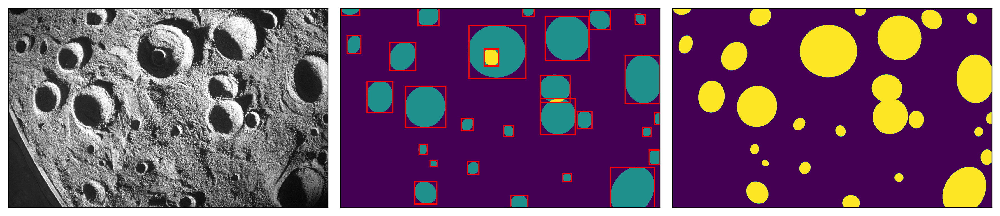

In [ ]:
test_path = 'B8_ACW_frame360.png'

# Load bounding boxes and ellipses
boxes_data = load_bounding_boxes([test_path])
# Assuming boxes_data is a list of dictionaries, get the boxes
boxes = boxes_data[0]['boxes'] if boxes_data else []

ellipses = load_projected_ellipses(test_path)

# Compute masks based on ellipses
masks = compute_mask((1200, 1920), ellipses['ellipse_sparse'])

fig, ax = plt.subplots(ncols=3)

# Load and display the original image
img = Image.open('Craters/' + test_path)
ax[0].imshow(img)

# Create a blank image for the masks
img_mask = np.zeros((1200, 1920))

# Combine all masks
for im in masks:
    img_mask += im.numpy()

# Plot the masks
ax[1].imshow(img_mask)

# Draw bounding boxes on the mask
for box in boxes:
    # Assuming box format is [x_min, y_min, x_max, y_max]
    x_min, y_min, x_max, y_max = box
    width = x_max - x_min
    height = y_max - y_min
    rect = patches.Rectangle((x_min, y_min), width, height, linewidth=1, edgecolor='red', facecolor='none')
    ax[1].add_patch(rect)

# Prepare to show contours
ellipses_out = []
for im in masks:
    im = im.numpy()
    threshold = 0.5
    canny_output = cv2.Canny(cv2.merge((im, im, im)), threshold, threshold * 2)
    contours, _ = cv2.findContours(canny_output, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    for contour in contours:
        if contour.shape[0] > 5:  # Filter to ensure the contour is valid
            ellipses_out.append(cv2.fitEllipse(contour))

# Create a blank image to draw ellipses
img_ellipses = np.zeros((1200, 1920))
for ellipse in ellipses_out:
    cv2.ellipse(
        img_ellipses,
        (int(ellipse[0][0]), int(ellipse[0][1])),
        (int(ellipse[1][0] / 2), int(ellipse[1][1] / 2)),
        ellipse[2],
        0,  # Start angle for drawing
        360,  # End angle for drawing
        (1),  # Color (white)
        -1,  # Fill the ellipse
    )
ax[2].imshow(img_ellipses)

# Remove axis ticks
for i in range(3):
    ax[i].set_xticks([])
    ax[i].set_yticks([])

fig.tight_layout()
plt.show()

In [ ]:
# Create a list to hold the names of PNG files
craters = []

# Iterate through each file in the directory
for filename in os.listdir('Craters') :
    craters.append(filename)

In [ ]:
# Build CDA database (typically takes about a minute)
from exterres_dataset_mask import CraterDataset

cd = CraterDataset( craters, ( 1200, 1920 ) )

Filter bad samples:
Total Images after Filtering 378


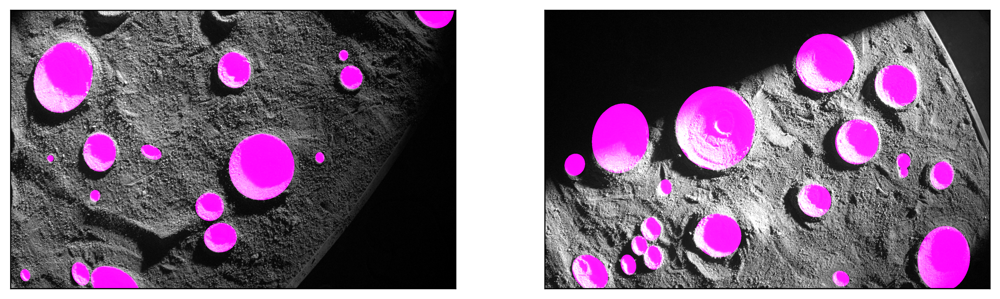

In [ ]:
# Show a random sample of images
n_samples = 2
fig, ax = plt.subplots( ncols = n_samples )

for i in range( n_samples ):
    img, target = cd.__getitem__( int( np.random.rand() * cd.__len__() ) )
    img = img.numpy()[0]
    img = np.stack( ( img, img, img ), axis = 2 )

    for mask in target['masks']:
        img[:,:,0] += mask.numpy()
        img[:,:,2] += mask.numpy()

    ax[i].imshow( img )
    ax[i].set_xticks( [] )
    ax[i].set_yticks( [] )
    # ax[i].set_title( 'Angle: {angle:d}, Sample: {sample:d}'.format( angle = target['view_angle'][0].item(), sample = target['image_id'].item() ) )
plt.show()

In [ ]:
# Return the batch as an iterable, skipping 'None' samples
def collate_fn(batch: Iterable):
    return tuple( zip( *( filter( lambda x:x is not None, batch ) ) ) )

In [ ]:
# Split the dataset into train and test
trainIndices, testIndices = cd.testSplit()
print( 'Training samples:', len( trainIndices ) )
print( 'Testing samples:', len( testIndices ) )

dataset_train = torch.utils.data.Subset( cd, trainIndices )
dataset_test = torch.utils.data.Subset( cd, testIndices )

# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
    dataset_train,
    batch_size = 4,
    shuffle = True,
    num_workers = 16,
    collate_fn = collate_fn
)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test,
    batch_size = 2,
    shuffle = False,
    num_workers = 16,
    collate_fn = collate_fn
)

Training samples: 336
Testing samples: 42


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 8, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
if __name__ == '__main__':
    for batch_idx, (images, targets) in enumerate(data_loader):
        for i, target in enumerate(targets) :
            if target is not None:
                boxes = target['boxes']
                labels = target['labels']
                masks = target['masks']
                ellipse = target['ellipse_sparse']

                print(f"Target for batch {batch_idx}:")
                print(f"  Boxes shape: {boxes.shape if boxes is not None else 'None'}")
                print(f"  Labels shape: {labels.shape if labels is not None else 'None'}")
                print(f"  Masks shape: {masks.shape if masks is not None else 'None'}")
                print(f"  Ellipse shape: {ellipse.shape if ellipse is not None else 'None'}")
            else:
                print(f"Target is None.")

        # Break after the first few batches for testing
        if batch_idx == 2:  # Adjust as needed
            break
# for i in range(len(dataset_train)):
#     try:
#         img, target = dataset_train[i]
#         print(f"Sample {i} loaded successfully.")
#     except Exception as e:
#         print(f"Error loading sample {i}: {e}")

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 8, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Target for batch 0:
  Boxes shape: torch.Size([16, 4])
  Labels shape: torch.Size([16])
  Masks shape: torch.Size([16, 1200, 1920])
  Ellipse shape: torch.Size([16, 5])
Target for batch 0:
  Boxes shape: torch.Size([25, 4])
  Labels shape: torch.Size([25])
  Masks shape: torch.Size([25, 1200, 1920])
  Ellipse shape: torch.Size([25, 5])
Target for batch 0:
  Boxes shape: torch.Size([17, 4])
  Labels shape: torch.Size([17])
  Masks shape: torch.Size([17, 1200, 1920])
  Ellipse shape: torch.Size([17, 5])
Target for batch 0:
  Boxes shape: torch.Size([25, 4])
  Labels shape: torch.Size([25])
  Masks shape: torch.Size([25, 1200, 1920])
  Ellipse shape: torch.Size([25, 5])
Target for batch 1:
  Boxes shape: torch.Size([20, 4])
  Labels shape: torch.Size([20])
  Masks shape: torch.Size([20, 1200, 1920])
  Ellipse shape: torch.Size([20, 5])
Target for batch 1:
  Boxes shape: torch.Size([15, 4])
  Labels shape: torch.Size([15])
  Masks shape: torch.Size([15, 1200, 1920])
  Ellipse shape: torch.

In [ ]:
initial_lr = 1e-2
momentum = 0.9
weight_decay = 0.0005

model.to( device )
params = [ p for p in model.parameters() if p.requires_grad ]
optimizer = SGD( params, lr = initial_lr, momentum = momentum, weight_decay = weight_decay )
scheduler = ReduceLROnPlateau( optimizer, patience = 5, cooldown = 2 )
# Early stopping????

In [ ]:
# Make metrics dict with the required keys
def init_run_metrics():
    return dict(
        train = dict(
            batch = list(),
            loss_total = list(),
            loss_classifier = list(),
            loss_box_reg = list(),
            loss_objectness = list(),
            loss_rpn_box_reg = list(),
            loss_mask = list(),
        ),
        valid = dict(
            batch = list(),
            loss_total = list(),
            loss_classifier = list(),
            loss_box_reg = list(),
            loss_objectness = list(),
            loss_rpn_box_reg = list(),
            loss_mask = list(),
        ),
    )

In [ ]:
model.train()

for batch_idx,(img, target) in enumerate(data_loader):
    img = [image.to(device) for image in img]  # Move images to device

    # Ensure target contains only labels, boxes, and masks
    target = [
        {
            'boxes': (t['boxes']).to(device) if 'boxes' in t else None,
            'labels': (t['labels']).to(device) if 'labels' in t else None,
            'masks': (t['masks']).to(device) if 'masks' in t else None,
            'ellipse_sparse': (t['ellipse_sparse']).to(device) if 'ellipse_sparse' in t else None,
        }
        for t in target
    ]

    # Remove any None values (if boxes, labels, or masks were not present)
    target = [t for t in target if t['boxes'] is not None or t['labels'] is not None or t['masks'] is not None or t['ellipse_sparse'] is not None]

    out = model(img, target)
    break

# Forward pass


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 8, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
out

{'loss_classifier': tensor(0.6402, device='cuda:0', grad_fn=<NllLossBackward0>),
 'loss_box_reg': tensor(0.5927, device='cuda:0', grad_fn=<DivBackward0>),
 'loss_mask': tensor(0.4067, device='cuda:0',
        grad_fn=<BinaryCrossEntropyWithLogitsBackward0>),
 'loss_objectness': tensor(1.3141, device='cuda:0',
        grad_fn=<BinaryCrossEntropyWithLogitsBackward0>),
 'loss_rpn_box_reg': tensor(0.0498, device='cuda:0', grad_fn=<DivBackward0>)}

In [ ]:
model_name = 'mask_rcnn'

start_e = 1
EPOCHS = 50

run_metrics = init_run_metrics()

for e in range(start_e, EPOCHS + start_e):
    train_loader, validation_loader, test_loader = ( data_loader, data_loader_test, data_loader_test )

    print(f'\n-----Epoch {e} started-----\n')

    since = time.time()

    model.train()
    bar = tq( train_loader, desc = f"Training [{e}]",
                postfix = {
                    "loss_total": 0.,
                    "loss_classifier": 0.,
                    "loss_box_reg": 0.,
                    "loss_ellipse": 0.,
                    "loss_objectness": 0.,
                    "loss_rpn_box_reg": 0.,
                } )

    for batch, ( images, targets ) in enumerate( bar, 1 ):
        images = list( image.to( device ) for image in images )
        targets = [
        {
            'boxes': (t['boxes']).to(device) if 'boxes' in t else None,
            'labels': (t['labels']).to(device) if 'labels' in t else None,
            'masks': (t['masks']).to(device) if 'masks' in t else None,
            'ellipse_sparse': (t['ellipse_sparse']).to(device) if 'ellipse_sparse' in t else None,
        }
        for t in targets
        ]

        loss_dict = model( images, targets )
        loss = sum( l for l in loss_dict.values() )

        if not math.isfinite(loss):
            del images, targets
            raise RuntimeError(f"Loss is {loss}, stopping training")

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        postfix = dict( loss_total = loss.item() )
        run_metrics["train"]["loss_total"].append( loss.item() )
        run_metrics["train"]["batch"].append( batch )

        for k, v in loss_dict.items():
            postfix[k] = v.item()
            run_metrics["train"][k].append( v.item() )

        bar.set_postfix(ordered_dict=postfix)

    with torch.no_grad():
        bar = tq(validation_loader, desc=f"Validation [{e}]",
                    postfix={
                        "loss_total": 0.,
                        "loss_classifier": 0.,
                        "loss_box_reg": 0.,
                        "loss_ellipse": 0.,
                        "loss_objectness": 0.,
                        "loss_rpn_box_reg": 0
                    })
        for batch, (images, targets) in enumerate(bar, 1):
            images = list( image.to( device ) for image in images )
            targets = [
            {
              'boxes': (t['boxes']).to(device) if 'boxes' in t else None,
              'labels': (t['labels']).to(device) if 'labels' in t else None,
              'masks': (t['masks']).to(device) if 'masks' in t else None,
              'ellipse_sparse': (t['ellipse_sparse']).to(device) if 'ellipse_sparse' in t else None,
            }
            for t in targets
            ]

            loss_dict = model( images, targets )
            loss = sum(l for l in loss_dict.values())

            if not math.isfinite(loss):
                del images, targets
                raise RuntimeError(f"Loss is {loss}, stopping validation")

            postfix = dict(loss_total=loss.item())
            run_metrics["valid"]["loss_total"].append(loss.item())
            run_metrics["valid"]["batch"].append(batch)

            for k, v in loss_dict.items():
                postfix[k] = v.item()
                run_metrics["valid"][k].append(v.item())

            bar.set_postfix(ordered_dict=postfix)

    time_elapsed = time.time() - since

    scheduler.step( mean( run_metrics["valid"]["loss_total"][(e - 1) * len(validation_loader):e * len(validation_loader)] ) )

    state_dict = {
        'epoch': e,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'run_metrics': run_metrics,
    }

    images, targets = next(iter(test_loader))
    images = list(image.to(device) for image in images)
    targets = [
        {
            'boxes': (t['boxes']).to(device) if 'boxes' in t else None,
            'labels': (t['labels']).to(device) if 'labels' in t else None,
            'masks': (t['masks']).to(device) if 'masks' in t else None,
            'ellipse_sparse': (t['ellipse_sparse']).to(device) if 'ellipse_sparse' in t else None,
        }
        for t in targets
    ]

    print(
        f"\nSummary:\n",
        f"\tEpoch: {e}/{EPOCHS + start_e - 1}\n",
        f"\tAverage train loss: {mean(run_metrics['train']['loss_total'][(e - 1) * len(train_loader):e * len(train_loader)])}\n",
        f"\tAverage validation loss: {mean(run_metrics['valid']['loss_total'][(e - 1) * len(validation_loader):e * len(validation_loader)])}\n",
        f"\tDuration: {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s"
    )

    joblib.dump( run_metrics, 'training_metrics/' + model_name )

    if e % 1 == 0:
        torch.save( model.state_dict(), 'training_checkpoints/' + model_name + '_' + str( e ) + '.blob' )
        print(f'Saved Model Checkpoint\n')
    print(f'-----Epoch {e} finished.-----\n')


-----Epoch 1 started-----



Validation [1]: 100%|██████████| 21/21 [00:14<00:00,  1.48it/s, loss_total=0.516, loss_classifier=0.123, loss_box_reg=0.218, loss_mask=0.157, loss_objectness=0.00479, loss_rpn_box_reg=0.0121]



Summary:
 	Epoch: 1/50
 	Average train loss: 0.9656032848925817
 	Average validation loss: 0.5456140083926064
 	Duration: 2m 37s
Saved Model Checkpoint

-----Epoch 1 finished.-----


-----Epoch 2 started-----



Validation [2]: 100%|██████████| 21/21 [00:14<00:00,  1.49it/s, loss_total=0.454, loss_classifier=0.0976, loss_box_reg=0.206, loss_mask=0.139, loss_objectness=0.00225, loss_rpn_box_reg=0.00891]



Summary:
 	Epoch: 2/50
 	Average train loss: 0.5572617593265715
 	Average validation loss: 0.48589674206007094
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 2 finished.-----


-----Epoch 3 started-----



Validation [3]: 100%|██████████| 21/21 [00:14<00:00,  1.47it/s, loss_total=0.465, loss_classifier=0.0999, loss_box_reg=0.206, loss_mask=0.14, loss_objectness=0.00435, loss_rpn_box_reg=0.014]



Summary:
 	Epoch: 3/50
 	Average train loss: 0.4918700424688203
 	Average validation loss: 0.4663873442581722
 	Duration: 2m 41s
Saved Model Checkpoint

-----Epoch 3 finished.-----


-----Epoch 4 started-----



Validation [4]: 100%|██████████| 21/21 [00:14<00:00,  1.42it/s, loss_total=0.442, loss_classifier=0.0861, loss_box_reg=0.206, loss_mask=0.126, loss_objectness=0.0138, loss_rpn_box_reg=0.0104]



Summary:
 	Epoch: 4/50
 	Average train loss: 0.4515345586197717
 	Average validation loss: 0.4492961196672349
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 4 finished.-----


-----Epoch 5 started-----



Validation [5]: 100%|██████████| 21/21 [00:14<00:00,  1.47it/s, loss_total=0.395, loss_classifier=0.0814, loss_box_reg=0.177, loss_mask=0.124, loss_objectness=0.00402, loss_rpn_box_reg=0.00884]



Summary:
 	Epoch: 5/50
 	Average train loss: 0.42666158612285343
 	Average validation loss: 0.4402309712909517
 	Duration: 2m 40s
Saved Model Checkpoint

-----Epoch 5 finished.-----


-----Epoch 6 started-----



Validation [6]: 100%|██████████| 21/21 [00:14<00:00,  1.49it/s, loss_total=0.454, loss_classifier=0.0845, loss_box_reg=0.215, loss_mask=0.137, loss_objectness=0.00486, loss_rpn_box_reg=0.0124]



Summary:
 	Epoch: 6/50
 	Average train loss: 0.4054210792694773
 	Average validation loss: 0.4675348926158178
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 6 finished.-----


-----Epoch 7 started-----



Validation [7]: 100%|██████████| 21/21 [00:14<00:00,  1.41it/s, loss_total=0.387, loss_classifier=0.0825, loss_box_reg=0.165, loss_mask=0.123, loss_objectness=0.0061, loss_rpn_box_reg=0.00964]



Summary:
 	Epoch: 7/50
 	Average train loss: 0.3849333127339681
 	Average validation loss: 0.42571514419146944
 	Duration: 2m 42s
Saved Model Checkpoint

-----Epoch 7 finished.-----


-----Epoch 8 started-----



Validation [8]: 100%|██████████| 21/21 [00:14<00:00,  1.43it/s, loss_total=0.397, loss_classifier=0.0935, loss_box_reg=0.175, loss_mask=0.118, loss_objectness=0.00175, loss_rpn_box_reg=0.00901]



Summary:
 	Epoch: 8/50
 	Average train loss: 0.37367796649535495
 	Average validation loss: 0.44757557199114845
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 8 finished.-----


-----Epoch 9 started-----



Validation [9]: 100%|██████████| 21/21 [00:14<00:00,  1.42it/s, loss_total=0.361, loss_classifier=0.077, loss_box_reg=0.156, loss_mask=0.11, loss_objectness=0.00834, loss_rpn_box_reg=0.00964]



Summary:
 	Epoch: 9/50
 	Average train loss: 0.3599017755616279
 	Average validation loss: 0.4220375645728338
 	Duration: 2m 42s
Saved Model Checkpoint

-----Epoch 9 finished.-----


-----Epoch 10 started-----



Validation [10]: 100%|██████████| 21/21 [00:14<00:00,  1.43it/s, loss_total=0.394, loss_classifier=0.0831, loss_box_reg=0.175, loss_mask=0.123, loss_objectness=0.000628, loss_rpn_box_reg=0.0115]



Summary:
 	Epoch: 10/50
 	Average train loss: 0.3445292338728905
 	Average validation loss: 0.45468711143448237
 	Duration: 2m 41s
Saved Model Checkpoint

-----Epoch 10 finished.-----


-----Epoch 11 started-----



Validation [11]: 100%|██████████| 21/21 [00:14<00:00,  1.42it/s, loss_total=0.376, loss_classifier=0.0711, loss_box_reg=0.177, loss_mask=0.117, loss_objectness=0.00046, loss_rpn_box_reg=0.00966]



Summary:
 	Epoch: 11/50
 	Average train loss: 0.33426807536965325
 	Average validation loss: 0.4604040341717856
 	Duration: 2m 42s
Saved Model Checkpoint

-----Epoch 11 finished.-----


-----Epoch 12 started-----



Validation [12]: 100%|██████████| 21/21 [00:14<00:00,  1.45it/s, loss_total=0.391, loss_classifier=0.0857, loss_box_reg=0.174, loss_mask=0.121, loss_objectness=0.000589, loss_rpn_box_reg=0.00948]



Summary:
 	Epoch: 12/50
 	Average train loss: 0.32859085500240326
 	Average validation loss: 0.4462087026664189
 	Duration: 2m 40s
Saved Model Checkpoint

-----Epoch 12 finished.-----


-----Epoch 13 started-----



Validation [13]: 100%|██████████| 21/21 [00:14<00:00,  1.40it/s, loss_total=0.385, loss_classifier=0.0685, loss_box_reg=0.178, loss_mask=0.123, loss_objectness=0.000665, loss_rpn_box_reg=0.0149]



Summary:
 	Epoch: 13/50
 	Average train loss: 0.3261928769449393
 	Average validation loss: 0.46347709212984356
 	Duration: 2m 42s
Saved Model Checkpoint

-----Epoch 13 finished.-----


-----Epoch 14 started-----



Validation [14]: 100%|██████████| 21/21 [00:14<00:00,  1.45it/s, loss_total=0.364, loss_classifier=0.0742, loss_box_reg=0.164, loss_mask=0.116, loss_objectness=0.00148, loss_rpn_box_reg=0.00865]



Summary:
 	Epoch: 14/50
 	Average train loss: 0.30161586971510024
 	Average validation loss: 0.4425592507634844
 	Duration: 2m 41s
Saved Model Checkpoint

-----Epoch 14 finished.-----


-----Epoch 15 started-----



Validation [15]: 100%|██████████| 21/21 [00:14<00:00,  1.43it/s, loss_total=0.384, loss_classifier=0.0881, loss_box_reg=0.173, loss_mask=0.114, loss_objectness=0.000465, loss_rpn_box_reg=0.00839]



Summary:
 	Epoch: 15/50
 	Average train loss: 0.2912974889789309
 	Average validation loss: 0.45635935806092764
 	Duration: 2m 42s
Saved Model Checkpoint

-----Epoch 15 finished.-----


-----Epoch 16 started-----



Validation [16]: 100%|██████████| 21/21 [00:14<00:00,  1.45it/s, loss_total=0.353, loss_classifier=0.0871, loss_box_reg=0.148, loss_mask=0.11, loss_objectness=0.000232, loss_rpn_box_reg=0.00841]



Summary:
 	Epoch: 16/50
 	Average train loss: 0.24973397932591893
 	Average validation loss: 0.42918327166920617
 	Duration: 2m 41s
Saved Model Checkpoint

-----Epoch 16 finished.-----


-----Epoch 17 started-----



Validation [17]: 100%|██████████| 21/21 [00:14<00:00,  1.44it/s, loss_total=0.367, loss_classifier=0.0838, loss_box_reg=0.152, loss_mask=0.123, loss_objectness=0.00021, loss_rpn_box_reg=0.00802]



Summary:
 	Epoch: 17/50
 	Average train loss: 0.23576987286408743
 	Average validation loss: 0.43301961819330853
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 17 finished.-----


-----Epoch 18 started-----



Validation [18]: 100%|██████████| 21/21 [00:14<00:00,  1.43it/s, loss_total=0.379, loss_classifier=0.0918, loss_box_reg=0.155, loss_mask=0.121, loss_objectness=0.00337, loss_rpn_box_reg=0.00857]



Summary:
 	Epoch: 18/50
 	Average train loss: 0.23207563906908035
 	Average validation loss: 0.4418578360761915
 	Duration: 2m 41s
Saved Model Checkpoint

-----Epoch 18 finished.-----


-----Epoch 19 started-----



Validation [19]: 100%|██████████| 21/21 [00:15<00:00,  1.39it/s, loss_total=0.361, loss_classifier=0.0764, loss_box_reg=0.15, loss_mask=0.126, loss_objectness=0.000351, loss_rpn_box_reg=0.00837]



Summary:
 	Epoch: 19/50
 	Average train loss: 0.22787737757677123
 	Average validation loss: 0.45385674635569256
 	Duration: 2m 42s
Saved Model Checkpoint

-----Epoch 19 finished.-----


-----Epoch 20 started-----



Validation [20]: 100%|██████████| 21/21 [00:14<00:00,  1.42it/s, loss_total=0.341, loss_classifier=0.0853, loss_box_reg=0.139, loss_mask=0.108, loss_objectness=0.000646, loss_rpn_box_reg=0.00832]



Summary:
 	Epoch: 20/50
 	Average train loss: 0.2237092341695513
 	Average validation loss: 0.44277841988063993
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 20 finished.-----


-----Epoch 21 started-----



Validation [21]: 100%|██████████| 21/21 [00:14<00:00,  1.46it/s, loss_total=0.335, loss_classifier=0.075, loss_box_reg=0.141, loss_mask=0.11, loss_objectness=0.000242, loss_rpn_box_reg=0.00828]



Summary:
 	Epoch: 21/50
 	Average train loss: 0.22258584077159563
 	Average validation loss: 0.4499885312148503
 	Duration: 2m 42s
Saved Model Checkpoint

-----Epoch 21 finished.-----


-----Epoch 22 started-----



Validation [22]: 100%|██████████| 21/21 [00:14<00:00,  1.41it/s, loss_total=0.335, loss_classifier=0.0689, loss_box_reg=0.144, loss_mask=0.112, loss_objectness=0.000706, loss_rpn_box_reg=0.0089]



Summary:
 	Epoch: 22/50
 	Average train loss: 0.2194060700989905
 	Average validation loss: 0.45706685667946223
 	Duration: 2m 42s
Saved Model Checkpoint

-----Epoch 22 finished.-----


-----Epoch 23 started-----



Validation [23]: 100%|██████████| 21/21 [00:14<00:00,  1.44it/s, loss_total=0.365, loss_classifier=0.0793, loss_box_reg=0.153, loss_mask=0.124, loss_objectness=0.000152, loss_rpn_box_reg=0.00878]



Summary:
 	Epoch: 23/50
 	Average train loss: 0.21786088957673028
 	Average validation loss: 0.4567581755774362
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 23 finished.-----


-----Epoch 24 started-----



Validation [24]: 100%|██████████| 21/21 [00:14<00:00,  1.43it/s, loss_total=0.376, loss_classifier=0.102, loss_box_reg=0.15, loss_mask=0.116, loss_objectness=0.000247, loss_rpn_box_reg=0.00848]



Summary:
 	Epoch: 24/50
 	Average train loss: 0.21306941285729408
 	Average validation loss: 0.45200670049304054
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 24 finished.-----


-----Epoch 25 started-----



Validation [25]: 100%|██████████| 21/21 [00:14<00:00,  1.43it/s, loss_total=0.371, loss_classifier=0.0952, loss_box_reg=0.149, loss_mask=0.117, loss_objectness=0.000313, loss_rpn_box_reg=0.00854]



Summary:
 	Epoch: 25/50
 	Average train loss: 0.21293079285394578
 	Average validation loss: 0.45357986716997056
 	Duration: 2m 42s
Saved Model Checkpoint

-----Epoch 25 finished.-----


-----Epoch 26 started-----



Validation [26]: 100%|██████████| 21/21 [00:15<00:00,  1.40it/s, loss_total=0.378, loss_classifier=0.0804, loss_box_reg=0.161, loss_mask=0.128, loss_objectness=0.000191, loss_rpn_box_reg=0.00844]



Summary:
 	Epoch: 26/50
 	Average train loss: 0.21114215609573184
 	Average validation loss: 0.45581334829330444
 	Duration: 2m 42s
Saved Model Checkpoint

-----Epoch 26 finished.-----


-----Epoch 27 started-----



Validation [27]: 100%|██████████| 21/21 [00:14<00:00,  1.43it/s, loss_total=0.338, loss_classifier=0.0687, loss_box_reg=0.145, loss_mask=0.116, loss_objectness=0.000204, loss_rpn_box_reg=0.00858]



Summary:
 	Epoch: 27/50
 	Average train loss: 0.2100269054727895
 	Average validation loss: 0.45197015291168574
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 27 finished.-----


-----Epoch 28 started-----



Validation [28]: 100%|██████████| 21/21 [00:14<00:00,  1.42it/s, loss_total=0.355, loss_classifier=0.078, loss_box_reg=0.147, loss_mask=0.121, loss_objectness=0.000196, loss_rpn_box_reg=0.00857]



Summary:
 	Epoch: 28/50
 	Average train loss: 0.2102732058791887
 	Average validation loss: 0.44654519926934017
 	Duration: 2m 42s
Saved Model Checkpoint

-----Epoch 28 finished.-----


-----Epoch 29 started-----



Validation [29]: 100%|██████████| 21/21 [00:14<00:00,  1.45it/s, loss_total=0.358, loss_classifier=0.0815, loss_box_reg=0.15, loss_mask=0.118, loss_objectness=0.00013, loss_rpn_box_reg=0.0086]



Summary:
 	Epoch: 29/50
 	Average train loss: 0.2106753316308771
 	Average validation loss: 0.44723425592694965
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 29 finished.-----


-----Epoch 30 started-----



Validation [30]: 100%|██████████| 21/21 [00:14<00:00,  1.47it/s, loss_total=0.35, loss_classifier=0.0806, loss_box_reg=0.142, loss_mask=0.117, loss_objectness=0.00124, loss_rpn_box_reg=0.00853]



Summary:
 	Epoch: 30/50
 	Average train loss: 0.21071378088423184
 	Average validation loss: 0.4551343790122441
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 30 finished.-----


-----Epoch 31 started-----



Validation [31]: 100%|██████████| 21/21 [00:15<00:00,  1.38it/s, loss_total=0.352, loss_classifier=0.0726, loss_box_reg=0.148, loss_mask=0.122, loss_objectness=0.000248, loss_rpn_box_reg=0.00849]



Summary:
 	Epoch: 31/50
 	Average train loss: 0.20915671633112998
 	Average validation loss: 0.4571071281319573
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 31 finished.-----


-----Epoch 32 started-----



Validation [32]: 100%|██████████| 21/21 [00:15<00:00,  1.38it/s, loss_total=0.346, loss_classifier=0.0821, loss_box_reg=0.14, loss_mask=0.116, loss_objectness=0.000158, loss_rpn_box_reg=0.00849]



Summary:
 	Epoch: 32/50
 	Average train loss: 0.21029767873031752
 	Average validation loss: 0.45607718399592806
 	Duration: 2m 45s
Saved Model Checkpoint

-----Epoch 32 finished.-----


-----Epoch 33 started-----



Validation [33]: 100%|██████████| 21/21 [00:14<00:00,  1.43it/s, loss_total=0.351, loss_classifier=0.0779, loss_box_reg=0.145, loss_mask=0.118, loss_objectness=0.00151, loss_rpn_box_reg=0.0085]



Summary:
 	Epoch: 33/50
 	Average train loss: 0.21102666358153024
 	Average validation loss: 0.4553409573577699
 	Duration: 2m 44s
Saved Model Checkpoint

-----Epoch 33 finished.-----


-----Epoch 34 started-----



Validation [34]: 100%|██████████| 21/21 [00:14<00:00,  1.41it/s, loss_total=0.337, loss_classifier=0.0742, loss_box_reg=0.144, loss_mask=0.111, loss_objectness=0.000118, loss_rpn_box_reg=0.00852]



Summary:
 	Epoch: 34/50
 	Average train loss: 0.20931296245682807
 	Average validation loss: 0.451970888035638
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 34 finished.-----


-----Epoch 35 started-----



Validation [35]: 100%|██████████| 21/21 [00:14<00:00,  1.46it/s, loss_total=0.385, loss_classifier=0.08, loss_box_reg=0.163, loss_mask=0.133, loss_objectness=0.000178, loss_rpn_box_reg=0.00852]



Summary:
 	Epoch: 35/50
 	Average train loss: 0.21118513725343205
 	Average validation loss: 0.45262213406108676
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 35 finished.-----


-----Epoch 36 started-----



Validation [36]: 100%|██████████| 21/21 [00:14<00:00,  1.40it/s, loss_total=0.37, loss_classifier=0.0902, loss_box_reg=0.151, loss_mask=0.119, loss_objectness=0.000302, loss_rpn_box_reg=0.00853]



Summary:
 	Epoch: 36/50
 	Average train loss: 0.21041403781800044
 	Average validation loss: 0.46090293924013775
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 36 finished.-----


-----Epoch 37 started-----



Validation [37]: 100%|██████████| 21/21 [00:14<00:00,  1.45it/s, loss_total=0.361, loss_classifier=0.094, loss_box_reg=0.145, loss_mask=0.113, loss_objectness=0.000193, loss_rpn_box_reg=0.00851]



Summary:
 	Epoch: 37/50
 	Average train loss: 0.21055237008702188
 	Average validation loss: 0.45258993336132597
 	Duration: 2m 41s
Saved Model Checkpoint

-----Epoch 37 finished.-----


-----Epoch 38 started-----



Validation [38]: 100%|██████████| 21/21 [00:14<00:00,  1.43it/s, loss_total=0.36, loss_classifier=0.083, loss_box_reg=0.149, loss_mask=0.119, loss_objectness=0.00117, loss_rpn_box_reg=0.00852]



Summary:
 	Epoch: 38/50
 	Average train loss: 0.20961483301860945
 	Average validation loss: 0.4557624175435021
 	Duration: 2m 41s
Saved Model Checkpoint

-----Epoch 38 finished.-----


-----Epoch 39 started-----



Validation [39]: 100%|██████████| 21/21 [00:14<00:00,  1.44it/s, loss_total=0.341, loss_classifier=0.0775, loss_box_reg=0.144, loss_mask=0.111, loss_objectness=0.000142, loss_rpn_box_reg=0.00853]



Summary:
 	Epoch: 39/50
 	Average train loss: 0.20979988025057883
 	Average validation loss: 0.4664545300460997
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 39 finished.-----


-----Epoch 40 started-----



Validation [40]: 100%|██████████| 21/21 [00:14<00:00,  1.41it/s, loss_total=0.347, loss_classifier=0.0762, loss_box_reg=0.147, loss_mask=0.115, loss_objectness=0.000481, loss_rpn_box_reg=0.00853]



Summary:
 	Epoch: 40/50
 	Average train loss: 0.20937728757659593
 	Average validation loss: 0.4605257085391453
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 40 finished.-----


-----Epoch 41 started-----



Validation [41]: 100%|██████████| 21/21 [00:14<00:00,  1.47it/s, loss_total=0.357, loss_classifier=0.0917, loss_box_reg=0.139, loss_mask=0.118, loss_objectness=0.000134, loss_rpn_box_reg=0.00853]



Summary:
 	Epoch: 41/50
 	Average train loss: 0.20851838570975123
 	Average validation loss: 0.4505014263448261
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 41 finished.-----


-----Epoch 42 started-----



Validation [42]: 100%|██████████| 21/21 [00:14<00:00,  1.41it/s, loss_total=0.348, loss_classifier=0.0753, loss_box_reg=0.147, loss_mask=0.116, loss_objectness=0.000591, loss_rpn_box_reg=0.00853]



Summary:
 	Epoch: 42/50
 	Average train loss: 0.21026528715377762
 	Average validation loss: 0.4512924665496463
 	Duration: 2m 42s
Saved Model Checkpoint

-----Epoch 42 finished.-----


-----Epoch 43 started-----



Validation [43]: 100%|██████████| 21/21 [00:14<00:00,  1.41it/s, loss_total=0.404, loss_classifier=0.0991, loss_box_reg=0.162, loss_mask=0.134, loss_objectness=0.000282, loss_rpn_box_reg=0.00852]



Summary:
 	Epoch: 43/50
 	Average train loss: 0.20966228239593052
 	Average validation loss: 0.45830794601213365
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 43 finished.-----


-----Epoch 44 started-----



Validation [44]: 100%|██████████| 21/21 [00:14<00:00,  1.43it/s, loss_total=0.362, loss_classifier=0.0732, loss_box_reg=0.156, loss_mask=0.123, loss_objectness=0.000217, loss_rpn_box_reg=0.00852]



Summary:
 	Epoch: 44/50
 	Average train loss: 0.21003638048257148
 	Average validation loss: 0.45345031931286767
 	Duration: 2m 42s
Saved Model Checkpoint

-----Epoch 44 finished.-----


-----Epoch 45 started-----



Validation [45]: 100%|██████████| 21/21 [00:14<00:00,  1.41it/s, loss_total=0.338, loss_classifier=0.0664, loss_box_reg=0.146, loss_mask=0.115, loss_objectness=0.00236, loss_rpn_box_reg=0.00852]



Summary:
 	Epoch: 45/50
 	Average train loss: 0.20990445234236263
 	Average validation loss: 0.4472360767069317
 	Duration: 2m 42s
Saved Model Checkpoint

-----Epoch 45 finished.-----


-----Epoch 46 started-----



Validation [46]: 100%|██████████| 21/21 [00:14<00:00,  1.44it/s, loss_total=0.352, loss_classifier=0.0776, loss_box_reg=0.148, loss_mask=0.113, loss_objectness=0.00409, loss_rpn_box_reg=0.00852]



Summary:
 	Epoch: 46/50
 	Average train loss: 0.20998579742653029
 	Average validation loss: 0.4449640853064401
 	Duration: 2m 42s
Saved Model Checkpoint

-----Epoch 46 finished.-----


-----Epoch 47 started-----



Validation [47]: 100%|██████████| 21/21 [00:14<00:00,  1.42it/s, loss_total=0.358, loss_classifier=0.0706, loss_box_reg=0.153, loss_mask=0.123, loss_objectness=0.0033, loss_rpn_box_reg=0.00852]



Summary:
 	Epoch: 47/50
 	Average train loss: 0.2095830798858688
 	Average validation loss: 0.4539357125759125
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 47 finished.-----


-----Epoch 48 started-----



Validation [48]: 100%|██████████| 21/21 [00:14<00:00,  1.46it/s, loss_total=0.359, loss_classifier=0.0777, loss_box_reg=0.148, loss_mask=0.125, loss_objectness=0.000229, loss_rpn_box_reg=0.00852]



Summary:
 	Epoch: 48/50
 	Average train loss: 0.20984834361644017
 	Average validation loss: 0.45501008204051424
 	Duration: 2m 43s
Saved Model Checkpoint

-----Epoch 48 finished.-----


-----Epoch 49 started-----



Validation [49]: 100%|██████████| 21/21 [00:14<00:00,  1.43it/s, loss_total=0.357, loss_classifier=0.0936, loss_box_reg=0.143, loss_mask=0.111, loss_objectness=0.000473, loss_rpn_box_reg=0.00852]



Summary:
 	Epoch: 49/50
 	Average train loss: 0.21012054543410028
 	Average validation loss: 0.45596971965971445
 	Duration: 2m 41s
Saved Model Checkpoint

-----Epoch 49 finished.-----


-----Epoch 50 started-----



Validation [50]: 100%|██████████| 21/21 [00:14<00:00,  1.44it/s, loss_total=0.354, loss_classifier=0.0806, loss_box_reg=0.15, loss_mask=0.115, loss_objectness=0.000462, loss_rpn_box_reg=0.00852]



Summary:
 	Epoch: 50/50
 	Average train loss: 0.20981567353010178
 	Average validation loss: 0.4426564063344683
 	Duration: 2m 41s
Saved Model Checkpoint

-----Epoch 50 finished.-----



In [ ]:
run_metrics = joblib.load( './training_metrics/mask_rcnn' )

In [ ]:
start_e = 1
EPOCHS = 50

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


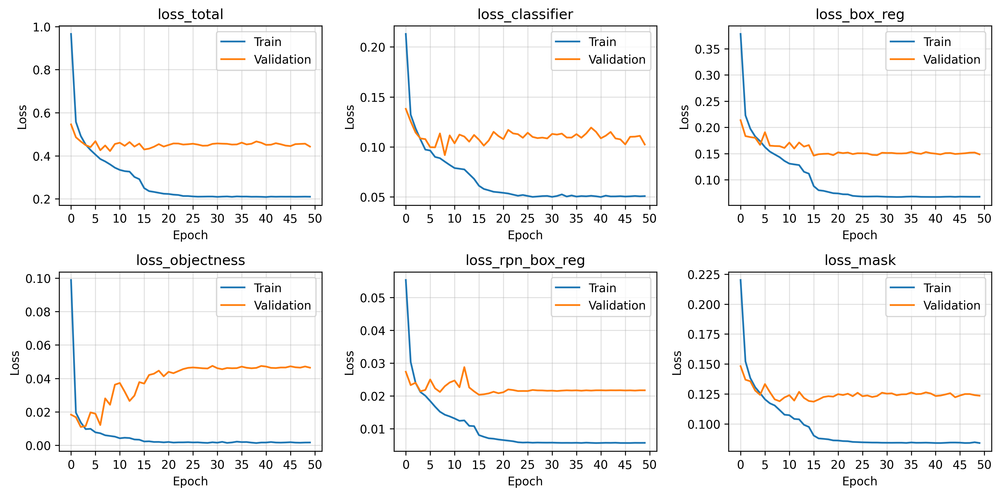

In [ ]:
epoch_losses_combined = []

for s in [ 'train', 'valid' ]:
    epoch_losses = {}
    n_batches = np.max( run_metrics[s]['batch'] )
    keys = list( run_metrics[s].keys() )[1:] # Skip the batch number

    # Collect average losses per key per epoch
    for key in keys:
        l = []
        for i in range( len( run_metrics[s][key] ) ):
            l.append( np.mean( run_metrics[s][key][i * n_batches:( i + 1 ) * n_batches] ) )
        epoch_losses[key] = l
    epoch_losses_combined.append( epoch_losses )

# Plot average loss per epoch
fig, ax = plt.subplots( ncols = 3, nrows = 2 )
for i, row in enumerate( ax ):
    for j, col in enumerate( row ):
        col.plot( epoch_losses_combined[0][keys[i*3 + j]] ) # Train Loss
        col.plot( epoch_losses_combined[1][keys[i*3 + j]] ) # Validation Loss
        col.legend( [ 'Train', 'Validation' ] )
        col.set_title( keys[i*3 + j] )
        col.grid( alpha = 0.4 )
        col.set_xlabel( 'Epoch' )
        col.set_ylabel( 'Loss' )
        col.set_xticks( np.arange( 0, EPOCHS + 1, 5 ) )
fig.tight_layout()
plt.show()

In [ ]:
np.argsort( epoch_losses_combined[1]['loss_total'] )

array([  8,   6,  15, ..., 390, 391, 392])

In [ ]:
path = "training_checkpoints/mask_rcnn_8.blob"
model.load_state_dict( torch.load( path ) )
model.eval()
model.to( device )
print( 'Loaded:', path )

<ipython-input-108-054c51827e9f>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict( torch.load( path ) )


Loaded: training_checkpoints/mask_rcnn_8.blob


In [ ]:
model.eval()
predictions = []

with torch.no_grad():
    bar = tq(data_loader_test)
    for batch, (images, targets) in enumerate(bar, 1):
        # Move images to device
        images = [image.to(device) for image in images]

        # Move targets to device, if they exist
        targets = [
            {
                'boxes': t['boxes'].to(device) if 'boxes' in t else None,
                'labels': t['labels'].to(device) if 'labels' in t else None,
                'masks': t['masks'].to(device) if 'masks' in t else None,
                'ellipse_sparse': t['ellipse_sparse'].to(device) if 'ellipse_sparse' in t else None,
            }
            for t in targets
        ]

        # Get predictions
        preds = model(images)

        # Move predictions to CPU and free up GPU memory
        for p in preds:
            for key, item in p.items():
                print(f"Prediction key: {key}, value: {item}")  # Print while still on GPU
                p[key] = item.to('cpu')  # Move to CPU after printing

        predictions.extend(preds)

        # Clear GPU memory explicitly
        torch.cuda.empty_cache()

  0%|          | 0/21 [00:00<?, ?it/s]

Prediction key: boxes, value: tensor([[ 110.3177,  450.7935,  170.2128,  536.4857],
        [ 218.7422,    0.0000,  296.4427,   65.9387],
        [ 843.4731,  137.9277, 1159.7219,  447.6992],
        [ 372.4846,  470.9547,  526.9841,  620.4678],
        [1155.4917,  456.7407, 1235.9218,  539.0663],
        [ 198.0020, 1045.5157,  254.7562, 1110.8079],
        [1642.2585,   60.2542, 1713.2361,  133.0210],
        [  30.6189,  311.3832,  273.0293,  606.1310],
        [ 988.9542,  859.5676, 1340.3037, 1183.5492],
        [ 615.8691,  620.3221,  702.2203,  724.2046],
        [   0.0000,   60.6049,  120.9132,  208.2426],
        [ 345.6151,  109.4439,  572.3651,  373.4948],
        [1418.4641,  499.9029, 1691.8237,  812.6848],
        [ 553.1322,    6.5217,  686.9884,  119.9296],
        [ 223.5914,  148.8580,  273.4303,  204.6416],
        [ 420.9382,  596.9503,  610.7805,  797.3582],
        [ 662.5950, 1003.6644,  713.5596, 1052.0863],
        [   0.0000, 1011.4218,   29.4076, 1064.2316]

  5%|▍         | 1/21 [00:06<02:15,  6.79s/it]

Prediction key: boxes, value: tensor([[1.7500e+02, 4.1735e+02, 2.4194e+02, 5.0631e+02],
        [9.5159e+02, 1.3927e+02, 1.2679e+03, 4.4758e+02],
        [3.0753e+02, 1.1282e+02, 3.6357e+02, 1.7203e+02],
        [1.0062e+02, 2.7845e+02, 3.5464e+02, 5.7512e+02],
        [1.2549e+03, 4.6395e+02, 1.3326e+03, 5.4613e+02],
        [2.5148e+02, 1.0279e+03, 3.0455e+02, 1.0922e+03],
        [7.0429e+02, 6.1162e+02, 7.9730e+02, 7.0988e+02],
        [4.5857e+02, 4.5409e+02, 6.1467e+02, 5.9855e+02],
        [4.3535e+02, 8.5938e+01, 6.7420e+02, 3.4811e+02],
        [6.0560e+01, 1.4848e+01, 2.0514e+02, 1.6252e+02],
        [1.0704e+03, 8.4830e+02, 1.4240e+03, 1.1899e+03],
        [1.7346e+03, 9.2033e+01, 1.8025e+03, 1.6485e+02],
        [6.5812e+02, 0.0000e+00, 7.9542e+02, 9.8547e+01],
        [7.3606e+02, 9.9430e+02, 7.8995e+02, 1.0464e+03],
        [1.5048e+03, 5.1704e+02, 1.7657e+03, 8.2763e+02],
        [5.0079e+02, 5.7675e+02, 6.9526e+02, 7.8228e+02],
        [1.6086e+02, 8.0669e+02, 2.1280e+0

 10%|▉         | 2/21 [00:07<01:01,  3.23s/it]

Prediction key: boxes, value: tensor([[1.0538e+03, 1.4432e+02, 1.3699e+03, 4.5070e+02],
        [2.4848e+02, 3.8468e+02, 3.1522e+02, 4.7432e+02],
        [0.0000e+00, 6.5580e+02, 1.3338e+02, 8.7823e+02],
        [1.6873e+02, 2.4315e+02, 4.3811e+02, 5.4557e+02],
        [1.3489e+03, 4.7514e+02, 1.4262e+03, 5.5780e+02],
        [3.0416e+02, 1.0089e+03, 3.6229e+02, 1.0761e+03],
        [3.9552e+02, 8.0530e+01, 4.5281e+02, 1.3786e+02],
        [1.8180e+03, 1.3002e+02, 1.8837e+03, 2.0039e+02],
        [7.9371e+02, 5.9987e+02, 8.8585e+02, 7.0641e+02],
        [1.1447e+03, 8.6942e+02, 1.4845e+03, 1.1895e+03],
        [5.2589e+02, 5.8217e+01, 7.7139e+02, 3.3106e+02],
        [5.4266e+02, 4.3154e+02, 7.0490e+02, 5.8331e+02],
        [7.5923e+02, 3.7989e-02, 9.0305e+02, 8.3162e+01],
        [1.3620e+02, 0.0000e+00, 2.8447e+02, 1.2216e+02],
        [5.8138e+02, 5.6286e+02, 7.8481e+02, 7.6781e+02],
        [1.5857e+03, 5.3847e+02, 1.8315e+03, 8.5002e+02],
        [8.0993e+02, 9.9113e+02, 8.6314e+0

 14%|█▍        | 3/21 [00:08<00:37,  2.07s/it]

Prediction key: boxes, value: tensor([[2.9965e+02, 3.6488e+02, 3.7004e+02, 4.5521e+02],
        [0.0000e+00, 2.1373e+02, 6.9363e+01, 3.2758e+02],
        [2.1826e+02, 2.2226e+02, 4.9823e+02, 5.2632e+02],
        [1.1239e+03, 1.4878e+02, 1.4346e+03, 4.5520e+02],
        [1.4145e+03, 4.8669e+02, 1.4868e+03, 5.6267e+02],
        [4.5752e+02, 5.9608e+01, 5.1529e+02, 1.2090e+02],
        [5.9934e+02, 4.2092e+02, 7.7174e+02, 5.7120e+02],
        [5.8944e+02, 4.7598e+01, 8.4684e+02, 3.2011e+02],
        [8.5702e+02, 5.9851e+02, 9.5243e+02, 6.9949e+02],
        [1.1964e+03, 8.7527e+02, 1.5335e+03, 1.1927e+03],
        [8.3340e+02, 7.4714e-01, 9.7413e+02, 7.8310e+01],
        [3.4103e+02, 9.9757e+02, 4.0299e+02, 1.0655e+03],
        [1.8886e+00, 6.3626e+02, 1.7027e+02, 8.5609e+02],
        [6.3991e+02, 5.5358e+02, 8.4486e+02, 7.6187e+02],
        [1.6386e+03, 5.5880e+02, 1.8791e+03, 8.6400e+02],
        [6.0075e+02, 1.1483e+03, 6.9774e+02, 1.1994e+03],
        [1.3869e+02, 1.1411e+03, 2.4041e+0

 19%|█▉        | 4/21 [00:08<00:26,  1.53s/it]

Prediction key: boxes, value: tensor([[2.8227e+02, 1.9606e+02, 5.7590e+02, 5.0482e+02],
        [1.2158e+03, 1.5751e+02, 1.5189e+03, 4.6539e+02],
        [1.4909e+03, 4.9980e+02, 1.5612e+03, 5.7668e+02],
        [9.3364e+02, 5.9349e+02, 1.0323e+03, 6.9531e+02],
        [5.3908e+02, 3.6627e+01, 6.0160e+02, 1.0064e+02],
        [3.9288e+02, 9.8478e+02, 4.5513e+02, 1.0514e+03],
        [3.6705e+02, 3.4062e+02, 4.4352e+02, 4.3361e+02],
        [6.7505e+02, 3.6193e+01, 9.3398e+02, 3.0455e+02],
        [3.9439e+01, 1.8087e+02, 1.3070e+02, 2.8993e+02],
        [6.7985e+02, 4.1002e+02, 8.5695e+02, 5.5996e+02],
        [6.5973e+02, 1.1425e+03, 7.5478e+02, 1.1998e+03],
        [1.7099e+02, 1.1209e+03, 2.8238e+02, 1.1998e+03],
        [5.2599e+02, 7.4777e+02, 5.8633e+02, 8.1081e+02],
        [1.2618e+03, 8.8201e+02, 1.5940e+03, 1.1928e+03],
        [9.2823e+02, 2.5728e-01, 1.0694e+03, 7.1115e+01],
        [0.0000e+00, 3.9673e+02, 5.0434e+01, 5.4872e+02],
        [3.1506e+02, 7.4826e+02, 3.7289e+0

 24%|██▍       | 5/21 [00:09<00:19,  1.24s/it]

Prediction key: boxes, value: tensor([[ 454.4514,  313.8006,  533.0797,  407.8680],
        [ 368.7232,  167.2633,  676.5029,  481.6695],
        [1321.1267,  178.6840, 1613.6965,  477.6809],
        [ 645.4499,   15.2836,  708.0364,   78.3501],
        [1579.5503,  518.8885, 1647.8604,  595.7866],
        [1033.0514,  593.6368, 1130.9954,  695.0146],
        [ 459.0577,  970.1431,  523.9649, 1039.8423],
        [ 111.8093,  134.8150,  213.2593,  247.6695],
        [   2.1437,  352.7469,  120.1190,  518.3975],
        [ 780.2360,  397.5172,  963.9742,  551.1852],
        [1338.7930,  893.2996, 1661.0361, 1193.8528],
        [ 782.5515,   28.0076, 1048.1234,  298.0732],
        [ 726.6446, 1137.3906,  827.7036, 1199.9072],
        [1011.8391,  984.3986, 1064.2979, 1034.1404],
        [ 100.6395,  573.0553,  295.0112,  808.5134],
        [ 217.2686, 1107.2079,  334.7422, 1198.9240],
        [ 390.6691,  727.3922,  446.6174,  791.7186],
        [1043.1240,    0.0000, 1184.0413,   70.9546]

 29%|██▊       | 6/21 [00:10<00:15,  1.06s/it]

Prediction key: boxes, value: tensor([[4.5422e+02, 1.4615e+02, 7.7697e+02, 4.6442e+02],
        [1.6616e+03, 5.4167e+02, 1.7282e+03, 6.1902e+02],
        [5.4643e+02, 2.9218e+02, 6.2530e+02, 3.8555e+02],
        [1.1290e+03, 5.9588e+02, 1.2257e+03, 6.9651e+02],
        [1.8622e+02, 9.6854e+01, 2.9461e+02, 2.1132e+02],
        [1.4235e+03, 2.0006e+02, 1.7018e+03, 4.9281e+02],
        [5.2787e+02, 9.5641e+02, 5.9348e+02, 1.0269e+03],
        [7.9378e+02, 1.1334e+03, 8.9909e+02, 1.1996e+03],
        [7.5049e+02, 8.6939e-01, 8.1678e+02, 6.0608e+01],
        [1.4127e+03, 9.0659e+02, 1.7222e+03, 1.1930e+03],
        [1.1539e+03, 4.4358e-01, 1.2944e+03, 7.7293e+01],
        [6.0433e+01, 3.1805e+02, 1.8934e+02, 4.8128e+02],
        [8.8452e+02, 2.2216e+01, 1.1597e+03, 2.9544e+02],
        [8.7857e+02, 3.9296e+02, 1.0636e+03, 5.4539e+02],
        [0.0000e+00, 5.5171e+02, 9.4992e+01, 7.2658e+02],
        [1.6354e+02, 5.4184e+02, 3.6836e+02, 7.8472e+02],
        [1.0905e+03, 9.8524e+02, 1.1458e+0

 33%|███▎      | 7/21 [00:11<00:13,  1.06it/s]

Prediction key: boxes, value: tensor([[7.0966e+02, 2.6077e+02, 7.9245e+02, 3.5487e+02],
        [1.7889e+03, 5.8428e+02, 1.8507e+03, 6.5762e+02],
        [6.1186e+02, 1.1152e+02, 9.5662e+02, 4.3619e+02],
        [9.1275e+02, 1.1253e+03, 1.0228e+03, 1.2000e+03],
        [6.4915e+02, 9.3951e+02, 7.1820e+02, 1.0090e+03],
        [1.6352e+03, 1.7378e-02, 1.7045e+03, 4.4813e+01],
        [6.0235e+02, 6.8131e+02, 6.6699e+02, 7.4867e+02],
        [3.2820e+02, 3.2871e+01, 4.4655e+02, 1.4881e+02],
        [1.5809e+03, 2.4189e+02, 1.8385e+03, 5.3085e+02],
        [1.7787e+02, 2.5349e+02, 3.2586e+02, 4.2135e+02],
        [1.5284e+03, 9.3290e+02, 1.8191e+03, 1.1935e+03],
        [6.0518e+01, 4.9250e+02, 2.0428e+02, 6.7146e+02],
        [1.2882e+03, 6.0708e+02, 1.3817e+03, 7.0464e+02],
        [1.0703e+03, 2.7670e+01, 1.3406e+03, 2.9776e+02],
        [1.0464e+03, 3.8966e+02, 1.2319e+03, 5.4550e+02],
        [2.7435e+02, 4.9121e+02, 5.0160e+02, 7.4233e+02],
        [3.5567e+02, 1.0627e+03, 4.8825e+0

 38%|███▊      | 8/21 [00:11<00:11,  1.14it/s]

Prediction key: boxes, value: tensor([[7.6937e+02, 2.5406e+02, 8.5500e+02, 3.4912e+02],
        [1.8301e+03, 6.0001e+02, 1.8892e+03, 6.7351e+02],
        [1.3423e+03, 6.1248e+02, 1.4347e+03, 7.1111e+02],
        [9.5826e+02, 1.1260e+03, 1.0641e+03, 1.2000e+03],
        [3.8814e+02, 1.0538e+03, 5.2476e+02, 1.1973e+03],
        [6.9383e+02, 9.3348e+02, 7.6478e+02, 1.0033e+03],
        [9.8860e+01, 4.7208e+02, 2.4617e+02, 6.5310e+02],
        [6.7496e+02, 1.0556e+02, 1.0181e+03, 4.3156e+02],
        [2.2166e+02, 2.3466e+02, 3.7603e+02, 4.0279e+02],
        [1.6343e+03, 2.5850e+02, 1.8861e+03, 5.4253e+02],
        [6.5392e+02, 6.7414e+02, 7.1875e+02, 7.4077e+02],
        [1.1350e+03, 3.4226e+01, 1.4041e+03, 3.0302e+02],
        [3.8090e+02, 1.6725e+01, 5.0299e+02, 1.3121e+02],
        [0.0000e+00, 2.0536e+02, 5.7955e+01, 3.1346e+02],
        [3.1941e+02, 4.8116e+02, 5.5413e+02, 7.3240e+02],
        [1.5678e+03, 9.4163e+02, 1.8489e+03, 1.1931e+03],
        [1.6912e+03, 3.3110e+00, 1.7584e+0

 43%|████▎     | 9/21 [00:12<00:10,  1.18it/s]

Prediction key: boxes, value: tensor([[8.7442e+02, 2.4610e+02, 9.5813e+02, 3.4541e+02],
        [7.7597e+02, 9.8149e+01, 1.1265e+03, 4.2824e+02],
        [3.0306e+02, 2.0410e+02, 4.6532e+02, 3.7311e+02],
        [1.7823e+03, 3.9730e+01, 1.8423e+03, 1.0085e+02],
        [1.0302e+03, 1.1260e+03, 1.1353e+03, 1.1982e+03],
        [7.7306e+02, 9.2732e+02, 8.4465e+02, 9.9762e+02],
        [1.4314e+03, 6.2605e+02, 1.5206e+03, 7.2429e+02],
        [3.9871e+02, 4.6035e+02, 6.4153e+02, 7.1315e+02],
        [1.6728e+02, 4.4047e+02, 3.2360e+02, 6.2211e+02],
        [9.9024e+02, 7.0486e+02, 1.0536e+03, 7.7027e+02],
        [1.7180e+03, 2.8823e+02, 1.9200e+03, 5.7109e+02],
        [1.1083e+03, 0.0000e+00, 1.1750e+03, 4.7904e+01],
        [1.2448e+03, 5.1779e+01, 1.5042e+03, 3.1407e+02],
        [1.2092e+03, 4.0311e+02, 1.3918e+03, 5.5393e+02],
        [1.8636e+03, 8.5730e+02, 1.9200e+03, 9.4383e+02],
        [1.6247e+03, 9.6260e+02, 1.8954e+03, 1.1942e+03],
        [1.3431e+03, 9.9831e+02, 1.3964e+0

 48%|████▊     | 10/21 [00:13<00:09,  1.20it/s]

Prediction key: boxes, value: tensor([[1834.5349,   64.0556, 1896.6697,  124.2556],
        [ 822.1052,  922.2427,  897.1277,  994.1741],
        [ 357.8158,  184.7246,  524.2798,  353.7593],
        [1487.1543,  636.3004, 1573.0632,  729.7234],
        [1073.6924, 1125.0878, 1180.3889, 1198.4958],
        [ 211.0703,  419.3777,  374.0542,  604.1945],
        [ 846.4171,   96.6383, 1193.4745,  424.8828],
        [1771.2253,  308.1643, 1920.0000,  593.5567],
        [ 940.4233,  241.6475, 1027.3132,  341.0900],
        [1271.1735,  407.2792, 1447.7823,  563.1953],
        [1048.6324,  703.2824, 1110.5609,  769.9883],
        [ 803.1154,  656.3730,  867.7224,  723.8907],
        [ 535.5200,    0.0000,  671.9163,   88.2049],
        [ 448.1044,  443.7708,  698.8042,  709.3235],
        [1313.2341,   62.6029, 1565.4849,  325.8294],
        [1178.6090,    0.0000, 1247.9104,   48.0900],
        [1390.1113, 1004.0374, 1441.8391, 1052.5054],
        [ 525.2927,  805.0378,  581.0167,  867.4030]

 52%|█████▏    | 11/21 [00:14<00:08,  1.24it/s]

Prediction key: scores, value: tensor([0.9992, 0.9990, 0.9989, 0.9984, 0.9983, 0.9983, 0.9980, 0.9978, 0.9970,
        0.9965, 0.9963, 0.9954, 0.9935, 0.9903, 0.9898, 0.9889, 0.9880, 0.9876,
        0.9854, 0.9839, 0.9707, 0.9660, 0.2307], device='cuda:0')
Prediction key: masks, value: tensor([[[[0.0663, 0.1142, 0.1389,  ..., 0.0000, 0.0000, 0.0000],
          [0.0967, 0.1665, 0.2025,  ..., 0.0000, 0.0000, 0.0000],
          [0.1270, 0.2188, 0.2661,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]]],


        [[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 

 57%|█████▋    | 12/21 [00:14<00:06,  1.32it/s]

Prediction key: boxes, value: tensor([[1125.6510,   76.7620, 1219.5931,  164.9463],
        [ 516.6387,  429.8673,  583.6483,  502.6423],
        [1644.4153,   73.4660, 1712.3873,  141.2361],
        [ 507.2089,  698.1901,  837.0125, 1017.5668],
        [  14.0587,  100.1600,  142.2289,  251.2695],
        [ 196.5547,   64.0826,  394.3880,  275.0860],
        [ 482.6875,  192.1628,  541.3812,  250.3366],
        [ 775.2079,  606.1072,  879.5492,  712.7414],
        [ 703.7034,  194.8473,  764.4805,  253.7736],
        [1427.9609,  408.0598, 1738.7722,  744.7290],
        [ 907.6562,   15.8189, 1116.3960,  207.4996],
        [ 818.6925,  978.3793,  858.9231, 1016.2468],
        [ 314.2299,  454.1733,  349.7289,  488.0740],
        [1084.2258,  455.0875, 1140.7480,  507.6744],
        [ 258.7230,  374.5192,  306.9995,  430.3422],
        [1650.2603,  294.6441, 1741.1589,  388.8478],
        [ 972.2493,  809.9237, 1170.8867, 1012.6364],
        [1574.4976,  156.0132, 1636.8926,  211.0588]

 62%|██████▏   | 13/21 [00:15<00:06,  1.32it/s]

Prediction key: boxes, value: tensor([[1259.6980,   83.3491, 1350.4308,  172.5946],
        [1757.4297,  107.6616, 1817.5762,  174.8187],
        [ 624.4943,  407.9357,  694.7574,  477.5813],
        [  97.8408,   43.2853,  234.4146,  200.2398],
        [ 831.4072,  177.8085,  890.6404,  237.2279],
        [ 885.8755,  598.0858,  992.6600,  704.0302],
        [ 295.2305,   13.9148,  511.5464,  232.2717],
        [ 603.0620,  686.1111,  943.6620, 1010.0269],
        [ 599.2951,  159.3837,  659.5077,  220.8376],
        [1041.3235,   16.0537, 1248.7109,  205.1028],
        [1205.1650,  457.9902, 1261.2573,  509.5795],
        [ 914.9823,  973.1218,  955.4197, 1011.3049],
        [1757.0127,  325.7695, 1840.5740,  422.5066],
        [1533.8040,  428.6963, 1836.0847,  761.1409],
        [ 353.7764,  337.1939,  404.7457,  392.7335],
        [1689.1783,  185.0206, 1746.3516,  239.4748],
        [1073.6541,  809.2841, 1272.5051, 1009.4976],
        [ 410.7741,  419.3165,  447.9878,  455.4822]

 67%|██████▋   | 14/21 [00:16<00:05,  1.40it/s]

Prediction key: boxes, value: tensor([[7.5169e+02, 3.8434e+02, 8.2591e+02, 4.6037e+02],
        [1.9863e+02, 0.0000e+00, 3.5259e+02, 1.4532e+02],
        [7.0548e+02, 6.6915e+02, 1.0580e+03, 1.0027e+03],
        [1.4038e+03, 1.0016e+02, 1.4903e+03, 1.8846e+02],
        [1.0150e+03, 5.9255e+02, 1.1235e+03, 7.0017e+02],
        [9.7438e+02, 1.6280e+02, 1.0346e+03, 2.2584e+02],
        [7.3661e+02, 1.3228e+02, 7.9952e+02, 1.9223e+02],
        [4.1184e+02, 0.0000e+00, 6.4242e+02, 1.9242e+02],
        [1.3372e+03, 4.6676e+02, 1.3926e+03, 5.1730e+02],
        [4.6753e+02, 2.9874e+02, 5.2125e+02, 3.5505e+02],
        [1.0247e+03, 9.6780e+02, 1.0658e+03, 1.0050e+03],
        [1.8717e+03, 1.5948e+02, 1.9191e+03, 2.2289e+02],
        [1.1879e+03, 2.3487e+01, 1.3916e+03, 2.1421e+02],
        [5.2723e+02, 3.8374e+02, 5.6791e+02, 4.2240e+02],
        [4.2069e+02, 5.2505e+02, 5.5884e+02, 6.7800e+02],
        [1.8038e+03, 2.2218e+02, 1.8604e+03, 2.7771e+02],
        [1.1842e+03, 8.2076e+02, 1.3875e+0

 71%|███████▏  | 15/21 [00:16<00:04,  1.48it/s]

Prediction key: boxes, value: tensor([[1.5203e+03, 1.2212e+02, 1.6045e+03, 2.1031e+02],
        [8.6730e+02, 3.7473e+02, 9.4099e+02, 4.4636e+02],
        [8.0217e+02, 6.6742e+02, 1.1589e+03, 9.9902e+02],
        [8.5880e+02, 1.1798e+02, 9.2179e+02, 1.7824e+02],
        [5.7413e+02, 2.7156e+02, 6.3018e+02, 3.2897e+02],
        [2.9715e+02, 0.0000e+00, 4.5822e+02, 1.0595e+02],
        [1.3110e+03, 4.5692e+01, 1.5055e+03, 2.2694e+02],
        [1.0953e+03, 1.6170e+02, 1.1586e+03, 2.2642e+02],
        [5.2487e+02, 0.0000e+00, 7.5725e+02, 1.6677e+02],
        [1.1240e+03, 5.9377e+02, 1.2324e+03, 7.0086e+02],
        [1.4457e+03, 4.8186e+02, 1.4979e+03, 5.3043e+02],
        [1.2772e+03, 8.3079e+02, 1.4769e+03, 1.0170e+03],
        [6.3376e+02, 3.6021e+02, 6.7778e+02, 4.0052e+02],
        [1.1185e+03, 9.6781e+02, 1.1572e+03, 1.0047e+03],
        [5.1321e+02, 5.0128e+02, 6.5986e+02, 6.5705e+02],
        [1.7815e+03, 9.1502e-01, 1.9200e+03, 1.3154e+02],
        [1.7391e+03, 4.9293e+02, 1.9200e+0

 76%|███████▌  | 16/21 [00:17<00:03,  1.55it/s]

Prediction key: boxes, value: tensor([[9.6395e+02, 3.6932e+02, 1.0383e+03, 4.4180e+02],
        [1.6116e+03, 1.4796e+02, 1.6929e+03, 2.3332e+02],
        [1.1948e+03, 1.6646e+02, 1.2588e+03, 2.3109e+02],
        [9.5950e+02, 1.1089e+02, 1.0244e+03, 1.7381e+02],
        [1.4107e+03, 6.4877e+01, 1.6036e+03, 2.3991e+02],
        [6.2203e+02, 2.4084e+00, 8.6514e+02, 1.4881e+02],
        [8.8417e+02, 6.6478e+02, 1.2432e+03, 1.0012e+03],
        [1.2137e+03, 5.9819e+02, 1.3208e+03, 7.0489e+02],
        [1.5320e+03, 4.9848e+02, 1.5811e+03, 5.4670e+02],
        [6.6715e+02, 2.5345e+02, 7.2398e+02, 3.1233e+02],
        [3.8045e+02, 2.7288e-01, 5.4482e+02, 7.3332e+01],
        [5.9439e+02, 4.8605e+02, 7.4750e+02, 6.4406e+02],
        [7.2856e+02, 3.4670e+02, 7.7030e+02, 3.8597e+02],
        [1.1941e+03, 9.6926e+02, 1.2338e+03, 1.0073e+03],
        [1.3612e+03, 8.3540e+02, 1.5527e+03, 1.0261e+03],
        [1.4148e+03, 0.0000e+00, 1.5806e+03, 6.3132e+01],
        [1.8087e+03, 5.2321e+02, 1.9184e+0

 81%|████████  | 17/21 [00:17<00:02,  1.56it/s]

Prediction key: boxes, value: tensor([[1.0418e+03, 3.6592e+02, 1.1156e+03, 4.3777e+02],
        [1.2755e+03, 1.7357e+02, 1.3393e+03, 2.3476e+02],
        [9.4924e+02, 6.6340e+02, 1.3083e+03, 1.0025e+03],
        [1.0407e+03, 1.0783e+02, 1.1074e+03, 1.6842e+02],
        [1.6824e+03, 1.6816e+02, 1.7616e+03, 2.5175e+02],
        [1.5969e+03, 5.1177e+02, 1.6466e+03, 5.5944e+02],
        [6.9719e+02, 6.4335e-01, 9.5343e+02, 1.3923e+02],
        [1.2851e+03, 6.0270e+02, 1.3905e+03, 7.0806e+02],
        [8.0174e+02, 3.3398e+02, 8.4715e+02, 3.7591e+02],
        [6.6375e+02, 4.7317e+02, 8.1521e+02, 6.3499e+02],
        [1.4923e+03, 7.6135e+01, 1.6773e+03, 2.5494e+02],
        [1.4899e+03, 6.3622e-01, 1.6473e+03, 8.0067e+01],
        [7.4266e+02, 2.3898e+02, 8.0025e+02, 2.9829e+02],
        [1.2521e+03, 9.7561e+02, 1.2903e+03, 1.0118e+03],
        [1.4198e+03, 8.4255e+02, 1.6044e+03, 1.0359e+03],
        [1.8554e+03, 5.6455e+02, 1.9195e+03, 8.4379e+02],
        [4.4877e+02, 6.0614e-01, 6.0321e+0

 86%|████████▌ | 18/21 [00:18<00:01,  1.64it/s]

Prediction key: boxes, value: tensor([[1.1344e+03, 3.6741e+02, 1.2089e+03, 4.3912e+02],
        [1.7649e+03, 1.9466e+02, 1.8375e+03, 2.7765e+02],
        [1.0310e+03, 6.6679e+02, 1.3869e+03, 1.0027e+03],
        [1.1410e+03, 1.0814e+02, 1.2062e+03, 1.6996e+02],
        [1.3682e+03, 6.1164e+02, 1.4706e+03, 7.1734e+02],
        [8.3514e+02, 2.2824e+02, 8.9471e+02, 2.8675e+02],
        [7.9994e+02, 1.4806e+00, 1.0494e+03, 1.2671e+02],
        [1.5824e+03, 0.0000e+00, 1.7363e+03, 1.0417e+02],
        [1.6724e+03, 5.3006e+02, 1.7207e+03, 5.7876e+02],
        [1.3225e+03, 9.7950e+02, 1.3610e+03, 1.0154e+03],
        [1.5788e+03, 1.0254e+02, 1.7564e+03, 2.7941e+02],
        [7.4812e+02, 4.5923e+02, 9.0640e+02, 6.2640e+02],
        [1.3702e+03, 1.8214e+02, 1.4313e+03, 2.4560e+02],
        [8.9804e+02, 3.2774e+02, 9.4001e+02, 3.6750e+02],
        [1.4840e+03, 8.5321e+02, 1.6670e+03, 1.0385e+03]], device='cuda:0')
Prediction key: labels, value: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

 90%|█████████ | 19/21 [00:18<00:01,  1.72it/s]

Prediction key: boxes, value: tensor([[1.8380e+03, 2.2589e+02, 1.9078e+03, 3.1123e+02],
        [1.2249e+03, 3.7174e+02, 1.2969e+03, 4.4244e+02],
        [1.4602e+03, 1.9910e+02, 1.5198e+03, 2.6026e+02],
        [1.1056e+03, 6.7259e+02, 1.4576e+03, 1.0040e+03],
        [1.2371e+03, 1.1441e+02, 1.3010e+03, 1.7683e+02],
        [1.4468e+03, 6.2391e+02, 1.5479e+03, 7.2670e+02],
        [1.7403e+03, 5.5276e+02, 1.7860e+03, 5.9848e+02],
        [8.9151e+02, 1.0880e+00, 1.1560e+03, 1.2472e+02],
        [8.3380e+02, 4.5431e+02, 9.9261e+02, 6.1869e+02],
        [1.6612e+03, 1.2387e+02, 1.8360e+03, 3.0497e+02],
        [1.6681e+03, 2.3113e+00, 1.8109e+03, 1.2890e+02],
        [9.9247e+02, 3.2220e+02, 1.0345e+03, 3.6080e+02],
        [9.2727e+02, 2.2039e+02, 9.8731e+02, 2.7962e+02],
        [1.3895e+03, 9.8224e+02, 1.4294e+03, 1.0209e+03],
        [1.5494e+03, 8.6721e+02, 1.7269e+03, 1.0546e+03],
        [6.0500e+02, 8.3531e+02, 8.7280e+02, 1.1453e+03]], device='cuda:0')
Prediction key: labels, 

 95%|█████████▌| 20/21 [00:19<00:00,  1.77it/s]

Prediction key: boxes, value: tensor([[1.2538e+03, 3.7652e+02, 1.3284e+03, 4.4656e+02],
        [1.8620e+03, 2.4009e+02, 1.9199e+03, 3.2228e+02],
        [1.1372e+03, 6.7224e+02, 1.4833e+03, 1.0074e+03],
        [1.0225e+03, 3.2166e+02, 1.0687e+03, 3.6238e+02],
        [9.6279e+02, 2.2047e+02, 1.0210e+03, 2.7837e+02],
        [9.3064e+02, 1.2392e+00, 1.1814e+03, 1.2218e+02],
        [1.4729e+03, 6.3100e+02, 1.5718e+03, 7.3274e+02],
        [1.6894e+03, 1.3771e+02, 1.8586e+03, 3.2055e+02],
        [1.7632e+03, 5.6341e+02, 1.8082e+03, 6.0810e+02],
        [1.6965e+03, 1.5125e+01, 1.8408e+03, 1.4272e+02],
        [1.2685e+03, 1.1931e+02, 1.3343e+03, 1.8375e+02],
        [8.6442e+02, 4.5095e+02, 1.0246e+03, 6.0997e+02],
        [1.4919e+03, 2.0792e+02, 1.5491e+03, 2.6781e+02],
        [1.5725e+03, 8.7387e+02, 1.7392e+03, 1.0567e+03],
        [1.4134e+03, 9.8657e+02, 1.4513e+03, 1.0221e+03]], device='cuda:0')
Prediction key: labels, value: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

100%|██████████| 21/21 [00:20<00:00,  1.02it/s]


Craters/B8_ACW_frame360.png
Craters/B8_ACW_frame378.png
Craters/B9_ACW_frame354.png
Craters/B8_ACW_frame300.png


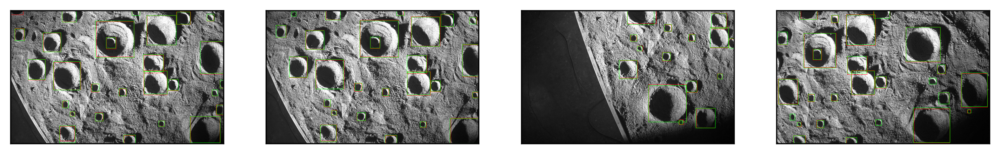

In [ ]:
# Show a random sample of predictions
n_samples = 4
fig, ax = plt.subplots( ncols = n_samples )

pred_threshold = 0.7

from exterres_dataset_mask import plot_ellipses

for i in range( n_samples ):
    test_set_index = int( np.random.rand() * len( testIndices ) )
    dataset_index = testIndices[test_set_index]
    img, target = cd.__getitem__( dataset_index )
    img = img.numpy()[0]
    img = np.stack( ( img, img, img ), axis = 2 )
    print(target['image_id'])

    # Apply prediction confidence mask
    mask = predictions[test_set_index]['scores'] > 0.7

    img = plot_ellipses( img, target['boxes'], target['masks'] )
    img = plot_ellipses( img, predictions[test_set_index]['boxes'][mask], predictions[test_set_index]['masks'][mask], color = ( 0, 1, 0 ) )

    ax[i].imshow( img )
    ax[i].set_xticks( [] )
    ax[i].set_yticks( [] )
    # ax[i].set_title( 'Angle: {angle:d}, Sample: {sample:d}'.format( angle = target['view_angle'][0].item(), sample = target['image_id'].item() ) )
plt.show()

tensor(1172.6221, grad_fn=<DivBackward0>) tensor(120.8542, grad_fn=<DivBackward0>)
tensor(550.1435, grad_fn=<DivBackward0>) tensor(466.2548, grad_fn=<DivBackward0>)
tensor(1678.4014, grad_fn=<DivBackward0>) tensor(107.3511, grad_fn=<DivBackward0>)
tensor(672.1107, grad_fn=<DivBackward0>) tensor(857.8784, grad_fn=<DivBackward0>)
tensor(78.1438, grad_fn=<DivBackward0>) tensor(175.7147, grad_fn=<DivBackward0>)
tensor(295.4714, grad_fn=<DivBackward0>) tensor(169.5843, grad_fn=<DivBackward0>)
tensor(512.0344, grad_fn=<DivBackward0>) tensor(221.2497, grad_fn=<DivBackward0>)
tensor(827.3785, grad_fn=<DivBackward0>) tensor(659.4243, grad_fn=<DivBackward0>)
tensor(734.0919, grad_fn=<DivBackward0>) tensor(224.3105, grad_fn=<DivBackward0>)
tensor(1583.3667, grad_fn=<DivBackward0>) tensor(576.3944, grad_fn=<DivBackward0>)
tensor(1012.0261, grad_fn=<DivBackward0>) tensor(111.6593, grad_fn=<DivBackward0>)
tensor(838.8078, grad_fn=<DivBackward0>) tensor(997.3130, grad_fn=<DivBackward0>)
tensor(331.97

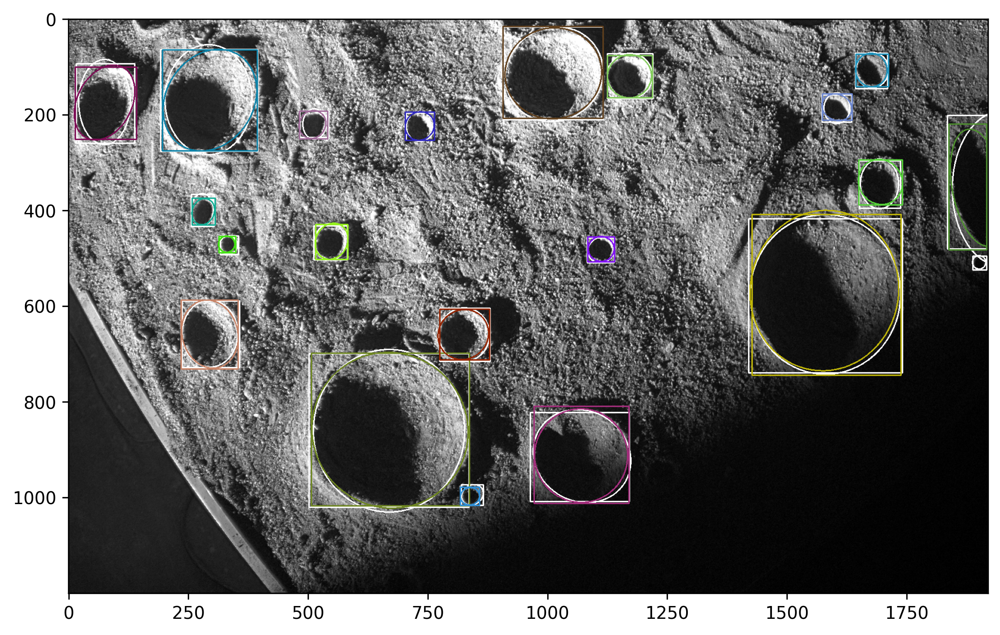

In [ ]:
model.eval()
device = torch.device( 'cpu' )
model.to( device )

img, target = cd.__getitem__( 360 )
out = model( img.unsqueeze( 0 ).to( device ), [ target ] )[0]

img = img.numpy()[0]
img = np.stack( ( img, img, img ), axis = 2 )

# Apply prediction confidence mask
mask = out['scores'] > 0.0

from exterres_dataset_mask import plot_ellipses

img = plot_ellipses( img, target['boxes'], target['ellipse_sparse'],(255,255,255))

for bbox, ellipse_mask in zip(out['boxes'][mask], out['masks'][mask]):
    color = (np.random.rand(), np.random.rand(), np.random.rand())

    # Draw bounding box on the image
    cv2.rectangle(
        img,
        (int(bbox[0]), int(bbox[1])),
        (int(bbox[2]), int(bbox[3])),
        color,
        2,
    )

    # draw mask
    bool_mask = ellipse_mask > 0.5
    bool_mask = bool_mask.squeeze()
    bool_mask = bool_mask.detach().cpu().numpy().astype(np.uint8) * 255
    contours, _ = cv2.findContours(bool_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours and len(contours[0]) >= 5:
        largest_contour = max(contours, key=cv2.contourArea)
        ellipse = cv2.fitEllipse(largest_contour)
        (x, y), (a, b), theta = ellipse
        theta = np.radians(theta)

        # Adjust theta as per your logic
        if theta > np.pi / 2:
            theta -= np.pi
        elif theta < -np.pi / 2:
            theta += np.pi
        # print(f"Ellipse fitted: {samples['ellipse_sparse'][-1]}")
    else:
            x_min, y_min, x_max, y_max = bbox
            x = (x_min + x_max) / 2
            y = (y_min + y_max) / 2
            a = (x_max - x_min) / 2
            b = (y_max - y_min) / 2
            theta = 0  # Default to 0 rotation
            print("fitted ellipse from bbox")

    cv2.ellipse(
        img,
        (int(x), int(y)),
        (int(a/2), int(b/2)),
        np.degrees(theta),
        0,  # Start Angle for drawing
        360,  # End Angle for drawing
        color,
        2,
    )


    print(  ( bbox[0] + bbox[2] ) / 2, ( bbox[1] + bbox[3] ) / 2 )

    # print(
    #     ellipse[0].item() - ( ( bbox[0].item() + bbox[2].item() ) / 2 ),
    #     ellipse[1].item() - ( ( bbox[1].item() + bbox[3].item() ) / 2 )
    # )

plt.imshow( img )
plt.show()